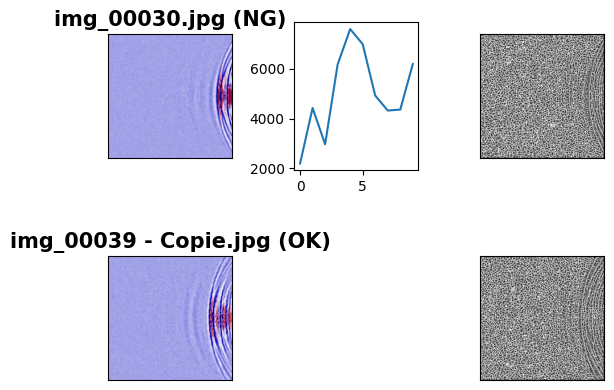

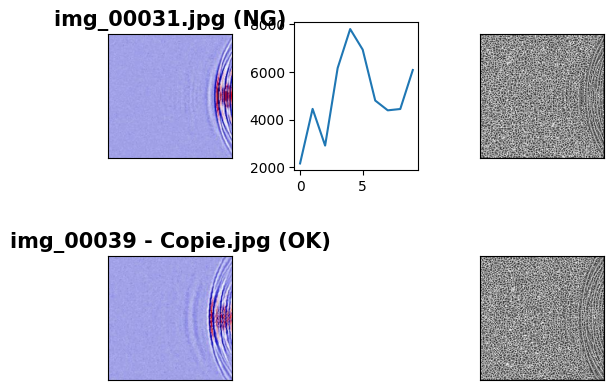

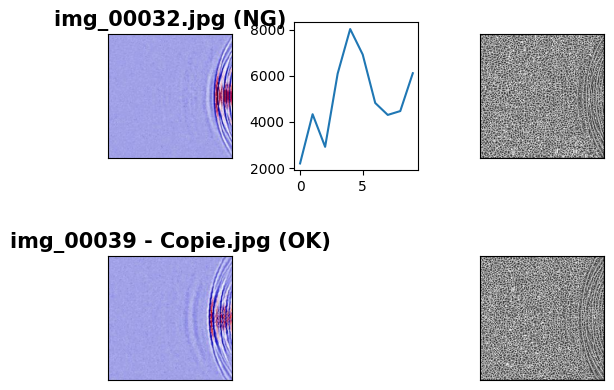

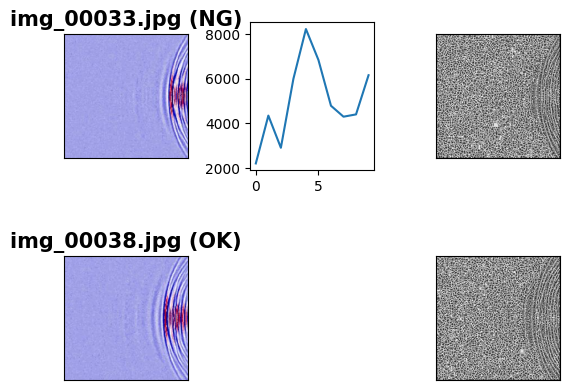

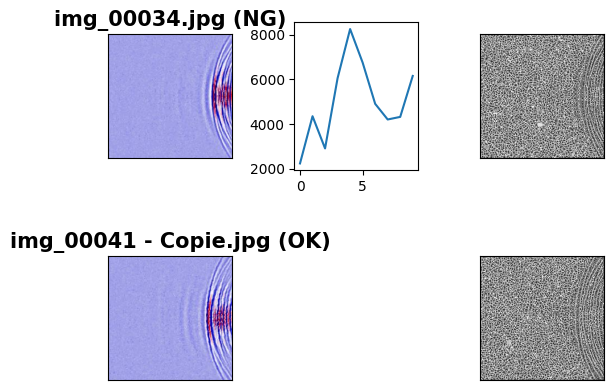

...

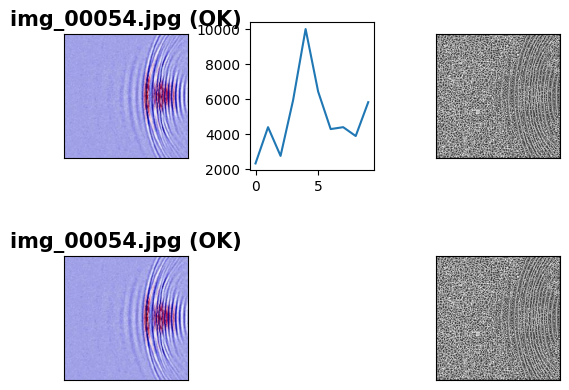

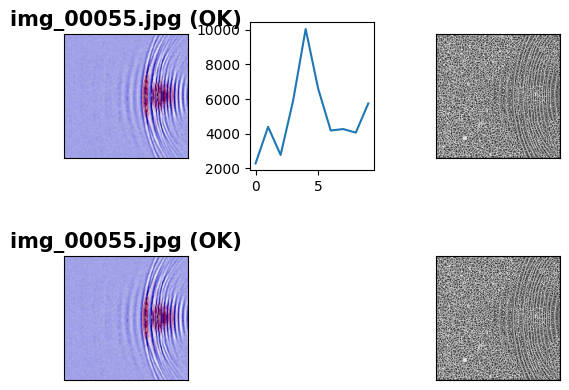

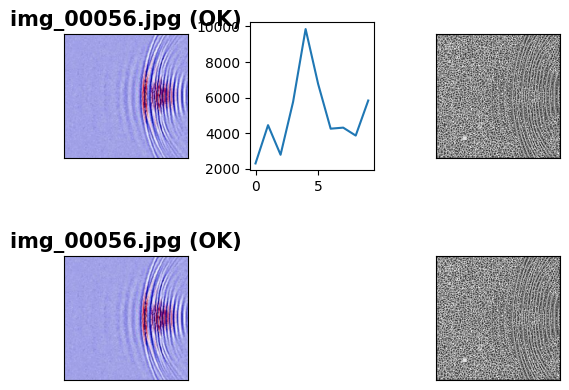

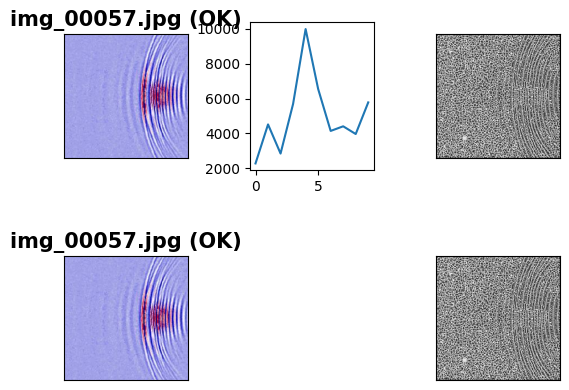

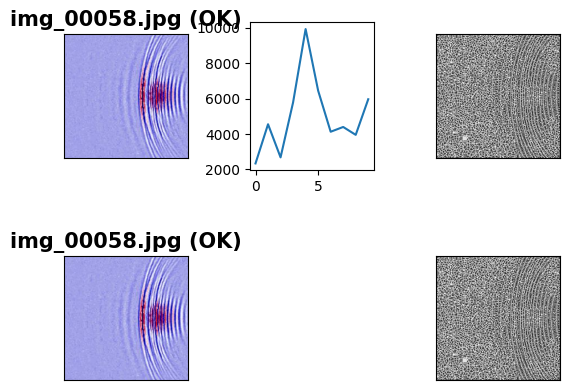

KeyboardInterrupt: 

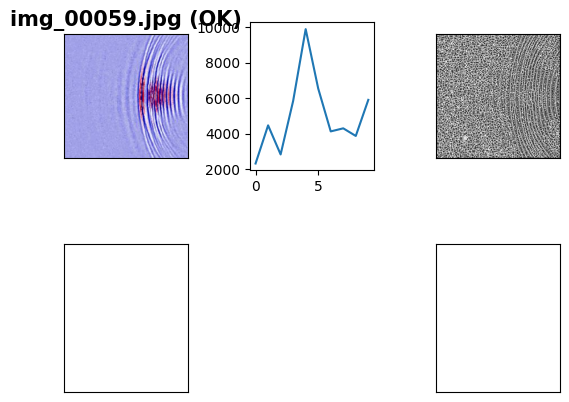

In [3]:
import os
import cv2
import numpy as np
from skimage.feature import local_binary_pattern
from sklearn.metrics import accuracy_score
from PIL import Image
import matplotlib.pyplot as plt
from scipy import spatial
from scipy.stats import wasserstein_distance


path_train = "C:/Users/ico/3D Objects/patterndata/train"
path_test = "C:/Users/ico/3D Objects/patterndata/test"

train_data = []
train_labels = []
test_data = []
test_labels = []
predicted_labels = []  # Initialize list to store predicted labels

class_labels = {
    "classA": "NG",
    "classB": "OK",
    # Add more class labels if necessary
}

# Load and label training images
for class_folder in os.listdir(path_train):
    class_path = os.path.join(path_train, class_folder)
    if os.path.isdir(class_path):
        for filename in os.listdir(class_path):
            image_path = os.path.join(class_path, filename)
            train_data.append(image_path)
            train_labels.append(class_labels[class_folder])

# Load and label test images
for class_folder in os.listdir(path_test):
    class_path = os.path.join(path_test, class_folder)
    if os.path.isdir(class_path):
        for filename in os.listdir(class_path):
            image_path = os.path.join(class_path, filename)
            test_data.append(image_path)
            test_labels.append(class_labels[class_folder])

num_pts = 8
radius = 1

for image_path_test, true_label in zip(test_data, test_labels):
    testimg = Image.open(image_path_test)
    testarr = np.asarray(testimg)
    testgray = cv2.cvtColor(testarr, cv2.COLOR_BGR2GRAY)
    lbp_test_features = local_binary_pattern(testgray, num_pts, radius, 'uniform')
    bins_num = int(lbp_test_features.max() + 1)
    test_hist, _ = np.histogram(lbp_test_features, bins=bins_num, range=(0, bins_num), density=None)

    fig = plt.figure()
    fig.subplots_adjust(wspace=.5)

    ax1 = fig.add_subplot(231)
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    plt.xticks([])
    plt.yticks([])
    ax1.set_title(os.path.basename(image_path_test) + " (" + true_label + ")", fontsize=15, fontweight='bold')
    plt.subplot(231), plt.imshow(testimg)
    fig.subplots_adjust(hspace=.5)
    plt.subplot(232), plt.plot(test_hist)

    ax3 = fig.add_subplot(233)
    ax3.set_xticklabels([])
    ax3.set_yticklabels([])
    plt.xticks([])
    plt.yticks([])
    plt.subplot(233), plt.imshow(lbp_test_features, cmap='gray')

    ax2 = fig.add_subplot(234)
    ax2.set_xticklabels([])
    ax2.set_yticklabels([])
    plt.xticks([])
    plt.yticks([])

    ax4 = fig.add_subplot(236)
    ax4.set_xticklabels([])
    ax4.set_yticklabels([])
    plt.xticks([])
    plt.yticks([])

    match = 0
    min_score = 10000  # Set a very large best score value initially

    for idx, train_image_path in enumerate(train_data):
        trainimg = Image.open(train_image_path)
        trainarr = np.asarray(trainimg)
        traingray = cv2.cvtColor(trainarr, cv2.COLOR_BGR2GRAY)
        lbp_train_features = local_binary_pattern(traingray, num_pts, radius, 'uniform')
        
        # Perform feature selection by ignoring useless features
        # (You can replace this with your preferred feature selection technique)
        selected_features = lbp_train_features  # Placeholder; modify this line with your feature selection code
        
        histogram, _ = np.histogram(selected_features, bins=bins_num, range=(0, bins_num), density=None)
        p = np.asarray(test_hist)
        q = np.asarray(histogram)
        filter_idx = np.where(np.logical_and(p != 0, q != 0))
        minima = np.minimum(test_hist, histogram)
        intersection = np.true_divide(np.sum(minima), np.sum(histogram))
        difidx = p - q
        score = .5 * (np.sum((p - q) ** 2 / (p + q + 1e-10)))
        scorewas = wasserstein_distance(p, q)
        scorechisq = .5 * (np.sum((p - q) ** 2 / (p + q + 1e-10)))
        scoresimple = np.sum((p - q) ** 2)
        scoreseucl = spatial.distance.euclidean(p, q)
        scoresman = spatial.distance.cityblock(p, q)

        # Min value calculation
        if score < min_score:
            min_score = score
            match = idx

    matched_image_path = train_data[match]
    matchedimg = Image.open(matched_image_path)
    matched_trainarr = np.asarray(matchedimg)
    matched_traingray = cv2.cvtColor(matched_trainarr, cv2.COLOR_BGR2GRAY)
    matched_train_lbp = local_binary_pattern(matched_traingray, num_pts, radius, 'uniform')

    predicted_label = train_labels[match]
    predicted_labels.append(predicted_label)

    # Display matched image
    ax2.set_title(os.path.basename(matched_image_path) + " (" + predicted_label + ")", fontsize=15, fontweight='bold')
    plt.subplot(234), plt.imshow(matchedimg)

    # Display LBP of matched image
    plt.subplot(236), plt.imshow(matched_train_lbp, cmap='gray')
    plt.show()

accuracy = accuracy_score(test_labels, predicted_labels)
print("Accuracy:", accuracy)
